# **直接ここで実行せずに、ファイルをコピーして下さい。**

### **左上のファイル > ドライブにコピーを保存**

#### **ライブラリをインポート**

メインライブラリ

In [1]:
import torch
import torch.nn as nn

脇役たち

In [2]:
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
import torchvision
import torch.nn.functional as F
from torchvision import transforms
import matplotlib.pyplot as plt
import math
import numpy as np

In [3]:
torch.set_printoptions(precision=2)  # torchの出力を小数点以下2桁に設定

In [4]:
# テンソルを見やすく表示するライブラリをインストール
!pip install git+https://github.com/HayatoHongo/print_formatted_tensor.git
# PyTorchのテンソルを見やすく表示する関数をインポート
from torch_print_tensor import print_formatted_tensor


  Cloning https://github.com/HayatoHongo/print_formatted_tensor.git to /tmp/pip-req-build-6xennm0n
  Running command git clone --filter=blob:none --quiet https://github.com/HayatoHongo/print_formatted_tensor.git /tmp/pip-req-build-6xennm0n
  Resolved https://github.com/HayatoHongo/print_formatted_tensor.git to commit f49215af7fa16f6b59af210897f472d421137dd4
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for torch_print_tensor: filename=torch_print_tensor-0.0.0-py3-none-any.whl size=1775 sha256=8b4c62c51bbf41e2496b5c71d8136e5c5d57bed610e416de45ceb2584402b3bb
  Stored in directory: /tmp/pip-ephem-wheel-cache-zffp5_mb/wheels/42/f2/8a/de376763a7e40db1b6011a73df3f759a5d4cdaf6278ffb8a4e
Successfully built torch_print_tensor


# **Part1 多層パーセプトロン(MLP:Multi-Layer Perceptron)**


下の動画が全てです。ドライアイになるくらい視聴してください。


[Watch the video!](https://youtu.be/048GGQxnk88)
- 9 minutes, bgm
- video_id = "048GGQxnk88"

## **まずはコツコツ計算 (本音：非常にめんどくさいので集中力がある序盤にやらせちゃおー)**

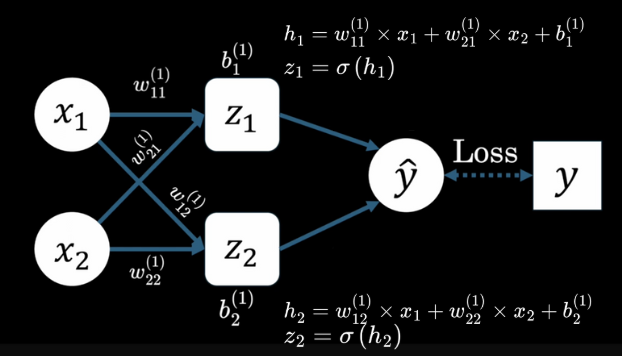

$$  x_{1},  x_{2}, w_{11}^{(1)}, w_{21}^{(1)},b_{1}^{(1)},w_{12}^{(1)}, w_{22}^{(1)},b_{2}^{(1)}, h_{1}, z_{1},h_{2}, z_{2}, w_{11}^{(2)}, w_{21}^{(2)}, b_{1}^{(2)} $$<br>
それぞれについて、x1, x2, w_11_1, w_21_1, b_1_1, w_12_1, w_22_1, b_2_1, h1, z1,
h2, z2, w_11_2, w_21_2, b_1_2 というように対応させる。


In [5]:
# w_11_1, w_21_1, w_12_1, w_22_1, w_11_2, w_21_2 は 1で初期化し、b_1_1, b_2_1, b_1_2は0で初期化するとする。(ランダムに初期化するのが一般的だが今回はわかりやすくした)
w_11_1, w_21_1, w_12_1, w_22_1, w_11_2, w_21_2, b_1_1, b_2_1, b_1_2 = 1, 1, 1, 1, 1 ,1, 0, 0, 0
x1, x2 = 1, -1 # x1 = 1, x2 = -1とする。

# 上記の図を参考に、h1とh2を式にする
h1 =  w_11_1*x1+w_21_1*x2 +b_1_1
h2 =  w_12_1*x1+w_22_1*x2 +b_2_1
print(f"h1: {h1},  h2: {h2}")

h1: 0,  h2: 0


**`Check Point`** <label><input type="checkbox" id="task1"> h1: 0,  h2: 0</label>

### **シグモイド関数を定義する**

```python
関数: sigmoid
戻り値: シグモイド関数の計算結果

def 関数名(x):
    return 式
```

- `sigmoid(x)` は **シグモイド関数** を定義する関数です。  
  - 入力値を **0 から 1 の範囲に変換** する、中間層によく用いられる活性化関数です。

$$
  \sigma(x) = \frac{1}{1 + e^{-x}}
$$

$$
e^{-x} は、 math.exp(-x) で計算できます。
$$


In [6]:
import math # mathモジュールをインポート

def sigmoid(x):
  return 1/ (1 + math.exp(-x))

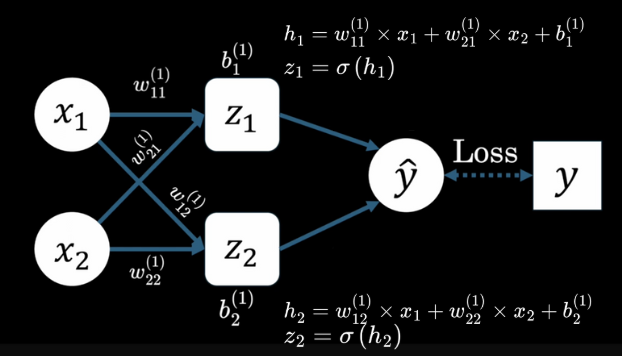

```python
関数: sigmoid
引数: h1またはh2

関数(引数)
```

In [7]:
# 上記の図を参考に、z1とz2を計算する式を立てる
z1 =  sigmoid(h1)
z2 =  sigmoid(h2)
print(f"z1: {z1},  z2: {z2}")

z1: 0.5,  z2: 0.5


**`Check Point`** <label><input type="checkbox" id="task1"> z1: 0.5,  z2: 0.5</label>

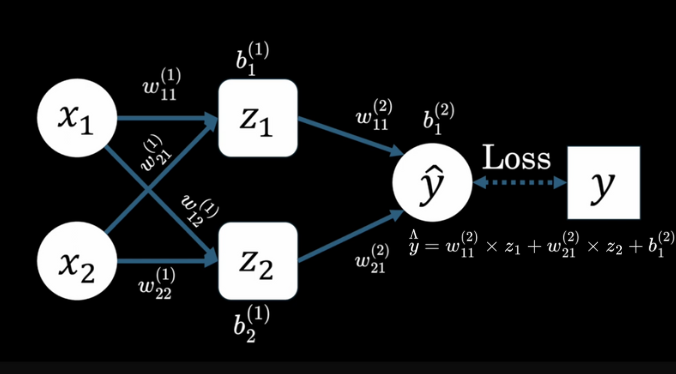

In [8]:
# 上記の図を参考に、予測値y_hatを計算する式を立てる
y_hat = w_11_2* z1 + w_21_2* z2 + b_1_2
print(f"y_hat: {y_hat}")

y_hat: 1.0


**`Check Point`** <label><input type="checkbox" id="task1"> y_hat: 1.0</label>

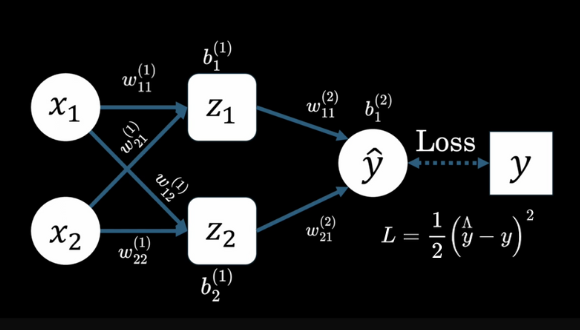

In [12]:
#正解値 y = 0 とする
y = 0

# 上記の図を参考に、予測値y_hatと正解値yとの二乗誤差を計算する
Loss = 0.5*(y_hat - y)**2
print(f"Loss (Squared Error): {Loss}")

Loss (Squared Error): 0.5


**`Check Point`** <label><input type="checkbox" id="task1"> Loss (Squared Error): 0.5</label>

# **うわ、めんどくさ、、**

シンプルなニューラルネットワークの順伝播ですら、めんどくさい。誤差逆伝播はもうめんどくさすぎるので省略します。<br>
複雑なニューラルネットワークになれば、これをいちいち定義するのは極めて困難です。<br>
Meta(Instagramの運営元)が2019年に**PyTorch**を
オープンソースでプレゼントしてくれました。ニューラルネットワーク界のパワポです。


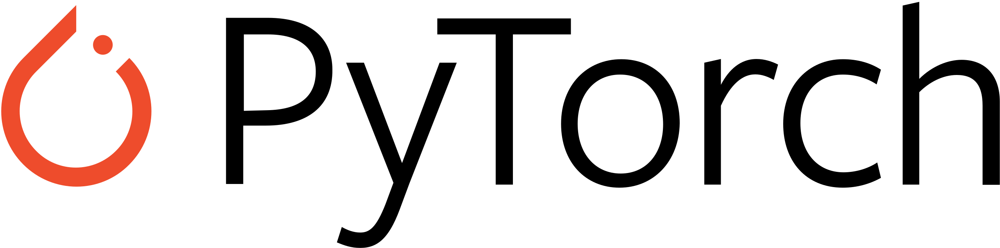

**PyTorchライブラリをインポートする**<br>
PyTorch使いたいです!って意味です。深層学習に携わる人は3日に1回は使います。

In [13]:
import torch
import torch.nn as nn

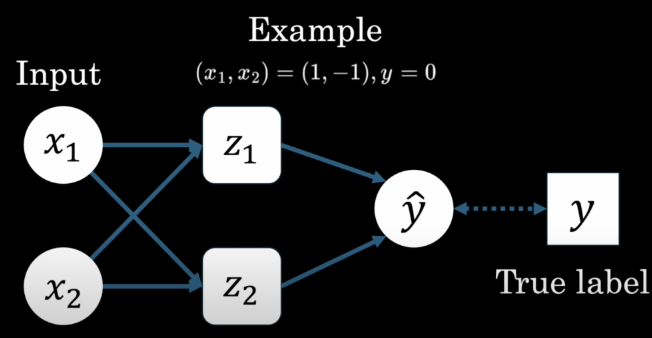

```python
関数: torch.tensor
引数: リスト [1.0, -1.0]

関数(引数)
```
PyTorchはテンソル（行列）を用います。数値のリストを作成するときは、`torch.tensor()` を用いる必要があります。

In [14]:
x = torch.tensor([1.0,-1.0])

※ ただのリストにしないように注意！

In [15]:
y = torch.tensor([0]) # y = 0を表現する。引数はリスト[0]

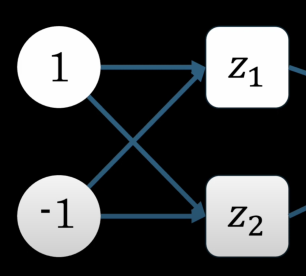

```python
インスタンス: fc1 = nn.Linear(入力次元, 出力次元)
入力次元: 2
出力次元: 2
```
- `nn.Linear(2, 2)` は、入力テンソルの次元を `2` から `2` へ変換する線形（全結合）層を作成。
- 動画内では重み1, バイアス0で初期化しているが、実際にはランダムに初期化されるので注意。

In [16]:
fc1 = nn.Linear(2,2)

fcは全結合層、fully connected layer の略です。

```python
インスタンス: fc1
メソッド: forward（省略可能）
引数: x
```
- 入力テンソル `x` を `fc1` で定義された線形層に通し、線形変換を適用し順伝播`forward`する。

In [17]:
h = fc1(x)#問 インスタンス.メソッド(引数)
print_formatted_tensor(h)

Tensor Size: [2]
tensor([
         -1.41,   1.06
       ])


```python
関数: torch.sigmoid
引数: h
```
- `torch.sigmoid(h)` は、シグモイド関数を適用し、値を `0` から `1` の範囲に活性化する。


In [18]:
z = torch.sigmoid(h)
print_formatted_tensor(z)

Tensor Size: [2]
tensor([
         0.20,   0.74
       ])


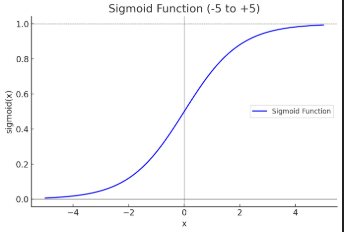

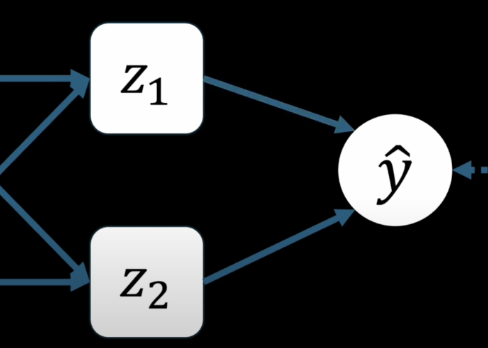

In [23]:
fc2 = nn.Linear(2,1)#問 nn.Linear(入力次元数, 出力次元数)

```python
インスタンス: fc2
メソッド: forward（省略可能）
引数: z
```

In [25]:
y_hat = fc2(z)
print_formatted_tensor(y_hat)

Tensor Size: [1]
tensor([
         -0.12
       ])


予測値 y_hatが出力されました。ここで、正解値 y（0）とのズレ（損失関数）を計算しましょう。

↑学習前で重みもバイアスもランダムに初期化されているので出力はランダムなのですが、ごく稀に最初から正解値の0に非常に近い0.01とかを叩き出してしまう強運の持ち主がいるので、その場合はセルを再度実行してください。ランダム値が再度設定されます。ちなみにこのシンプルな運試し現象、強い宝くじ仮説というそれなりに上のレベルの話題に繋がるので頭の片隅に入れておくのおすすめ。

**`Check Point`** <label><input type="checkbox" id="task1"> 学習前のモデルでは、出力値`output`が正解の0とある程度離れていることを確認した</label>

### **損失関数の設定**

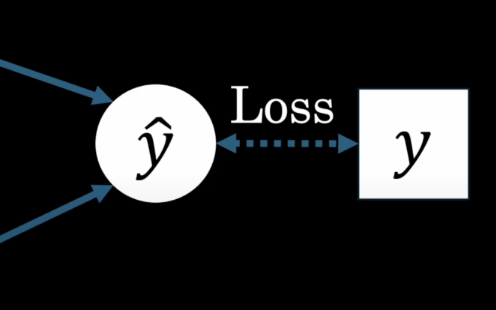

```python
クラス: nn.MSELoss
引数: なし (デフォルトの引数を使用)

インスタンス = クラス(引数)
```

- `nn.MSELoss()` は **Mean Squared Error (MSE) 損失関数** の PyTorch 実装です。  
  - **MSE (平均二乗誤差)** は **回帰タスク** で一般的に使用される損失関数。
  - 出力値と目標値の **誤差の二乗の平均** を計算します。


$$
  \text{MSE} = \frac{1}{N} \sum_{i=1}^{N} (\hat~{y}_i- y_i )^2
$$
- $$ N  はデータのサンプル数(今回はN=1)。\hat~{y}_iは正解ラベル (target)。y_iはモデルの予測値 (output)。
$$

  - **回帰問題** では **連続値** を予測するため、MSE を使用することが多い。
  - **分類問題** ではクロスエントロピー (`nn.CrossEntropyLoss()`) などを使用。

In [21]:
criterion = nn.MSELoss()

**y_hat と y の値を再確認する**<br>
grad_fn の表示は気にしないでください。

In [22]:
print("y_hat", y_hat)
print("y", y)

y_hat tensor([-0.96,  0.00], grad_fn=<ViewBackward0>)
y tensor([0])


```python
インスタンス: criterion
メソッド: forward（省略可能）
引数: y_hat, y
```

In [26]:
loss = criterion(y_hat,y)
print("loss", loss)

loss tensor(0.01, grad_fn=<MseLossBackward0>)


ここまでをクラスにまとめる

In [33]:
# クラスにまとめただけで、処理は同じなのでコードは読み飛ばしても良い
import torch
import torch.nn as nn

class MLP(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(2, 2)
        self.fc2 = nn.Linear(2, 1)

    def forward(self, x):
        h = self.fc1(x)
        z = torch.sigmoid(h)
        y_hat = self.fc2(z)
        return y_hat

In [34]:
model = MLP()#問 クラス(引数)で、MLPモデルのインスタンスを作成する。ヒント:クラスは先ほど定義したMLPクラス。引数はなし。

注意: MLPと間違えてMSEを指定しないように注意！

```python
print("model parameters\n", list(model.parameters()) )
```
`model.parameters()`はモデルの重みとバイアスを含むパラメータインスタンスであり、`list`で中の要素を確認できます。

In [35]:
# モデルのパラメータインスタンス
print("model parameters\n",list(model.parameters()) ) #問 モデルパラメータのインスタンス model.parameters() を代入するだけ

model parameters
 [Parameter containing:
tensor([[-0.61,  0.50],
        [-0.68, -0.15]], requires_grad=True), Parameter containing:
tensor([-0.17, -0.63], requires_grad=True), Parameter containing:
tensor([[ 0.09, -0.43]], requires_grad=True), Parameter containing:
tensor([-0.52], requires_grad=True)]


**SGD（確率的勾配降下法）によるパラメータ更新**

SGD (**Stochastic Gradient Descent**) は、機械学習モデルの重みを更新し、損失を最小化するための最適化手法です。

$$
w \leftarrow w - \eta \frac{\partial L}{\partial w}
$$

$$
\ w : 重み \ \ \ \
\ L :損失関数 \ \ \ \
\ \frac{\partial L}{\partial w}：損失の勾配 \ \ \ \
\ \eta ：学習率（更新の大きさ）
$$


```python
インスタンス: optimizer = optim.SGD(パラメータインスタンス, 学習率)
パラメータインスタンス: model.parameters()
学習率: 0.1
```

In [36]:
import torch.optim as optim
optimizer = optim.SGD(model.parameters(),lr=0.1)

**学習コード**

勾配降下法によるパラメータ更新を確認しましょう。全てのパラメータをprintすると大変なので、fc1の重みに絞ってprintします。

In [44]:
x = torch.tensor([1.0, -1.0]) # 入力テンソル x
y = torch.tensor([0.0]) # 正解テンソル y

# 1. 勾配の初期化
optimizer.zero_grad()
print("Step 1: 勾配の初期化後")
print("fc1の重みの勾配:", model.fc1.weight.grad)

# 2. 順伝播
y_hat = model.forward(x)
print("\nStep 2: 順伝播後")
print("予測値 (y_hat):", y_hat)

# 3. 損失の計算
loss = criterion(y_hat, y)
print("\nStep 3: 損失計算後")
print("損失:", loss.item())

# 4. 逆伝播（勾配計算）
loss.backward()
print("\nStep 4: 逆伝播後 (勾配計算)")
print("fc1の重みの勾配:\n", model.fc1.weight.grad)

# 6. パラメータ更新
print("\nStep 5: パラメータ更新前")
print("更新前の fc1 の重み:\n", model.fc1.weight)

optimizer.step()
print("\nStep 6: パラメータ更新後")
print("更新後の fc1 の重み:\n", model.fc1.weight)

Step 1: 勾配の初期化後
fc1の重みの勾配: None

Step 2: 順伝播後
予測値 (y_hat): tensor([-0.13], grad_fn=<ViewBackward0>)

Step 3: 損失計算後
損失: 0.017567871138453484

Step 4: 逆伝播後 (勾配計算)
fc1の重みの勾配:
 tensor([[-0.01,  0.01],
        [ 0.02, -0.02]])

Step 5: パラメータ更新前
更新前の fc1 の重み:
 Parameter containing:
tensor([[-0.60,  0.49],
        [-0.71, -0.12]], requires_grad=True)

Step 6: パラメータ更新後
更新後の fc1 の重み:
 Parameter containing:
tensor([[-0.60,  0.49],
        [-0.71, -0.12]], requires_grad=True)



前回に計算した勾配が残らないよう、順伝播する前に勾配をNoneで初期化します。順伝播で予測を行い、正解とのズレ（損失）を計算します。
$
損失を逆伝播して求めた勾配\frac{\partial L}{\partial w}に基づいて、パラメータを更新します。
$

上記のコードに対して、Shift + Enter を、**ゆっくり**5回繰り返してください。<br>
特に、Step3の損失が減っていく様子に着目してください。

#### **トレーニング後のモデルで入力に対する出力が正解の0に近いかを確認する**

In [45]:
final_output = model.forward(x)
print("\nfinal_output:", f"{final_output.item():.2f}")


final_output: -0.10


**`Check Point`** <label><input type="checkbox" id="task1"> 学習前と学習後を比較して、出力値`final_output`が正解の0に近付いたことを確認した</label>

# **Part2 手書き文字の認識**

### **MINIST手書き文字データセットをダウンロード**

In [ ]:
# 画像をTensorに変換（[0,1]に正規化）するtransform
transform = transforms.ToTensor()

# MNISTの訓練データとテストデータをダウンロード
train_dataset = torchvision.datasets.MNIST(root='./data', train=True, download=True, transform=transform)
test_dataset  = torchvision.datasets.MNIST(root='./data', train=False, download=True, transform=transform)

### **MINIST手書き文字データセットの最初のサンプルを表示**

In [ ]:
# 表示精度を小数点以下2桁に設定（科学表記を使わない）
torch.set_printoptions(precision=2, sci_mode=False)

# train_datasetの最初のサンプルについて の画像とラベルを取得（画像は shape: [1, 28, 28]）
print("first data of train_dataset")
train_dataset[0] #最初のサンプルなのでインデックスは0

### **うわ、なんだこれ**

そう思った方もいるでしょう。この数字の羅列こそ **「テンソル」** です。<br><br>

ChatGPTをはじめとした現代のAIを支えるのは深層学習であり、その深層学習を支えるのがテンソルです。<br><br>

この数字の羅列と数字の羅列同士の掛け算と足し算が、画像を認識し、会話をして、絵を描き、ロボットを動かすことを理解するとき、<br>
鼓動は激しくなり、眠れなくなる。それは深層学習の世界に入ってしまった副作用です。<br><br>

**ようこそ深層学習の世界へ。この病気はもう治らない。**<br><br>

それでは基本にして原点のテンソルを見ていきましょう。<br><br>


### 先ほどのテンソルは画像データを示していました。可視化すると以下の図のようになります。

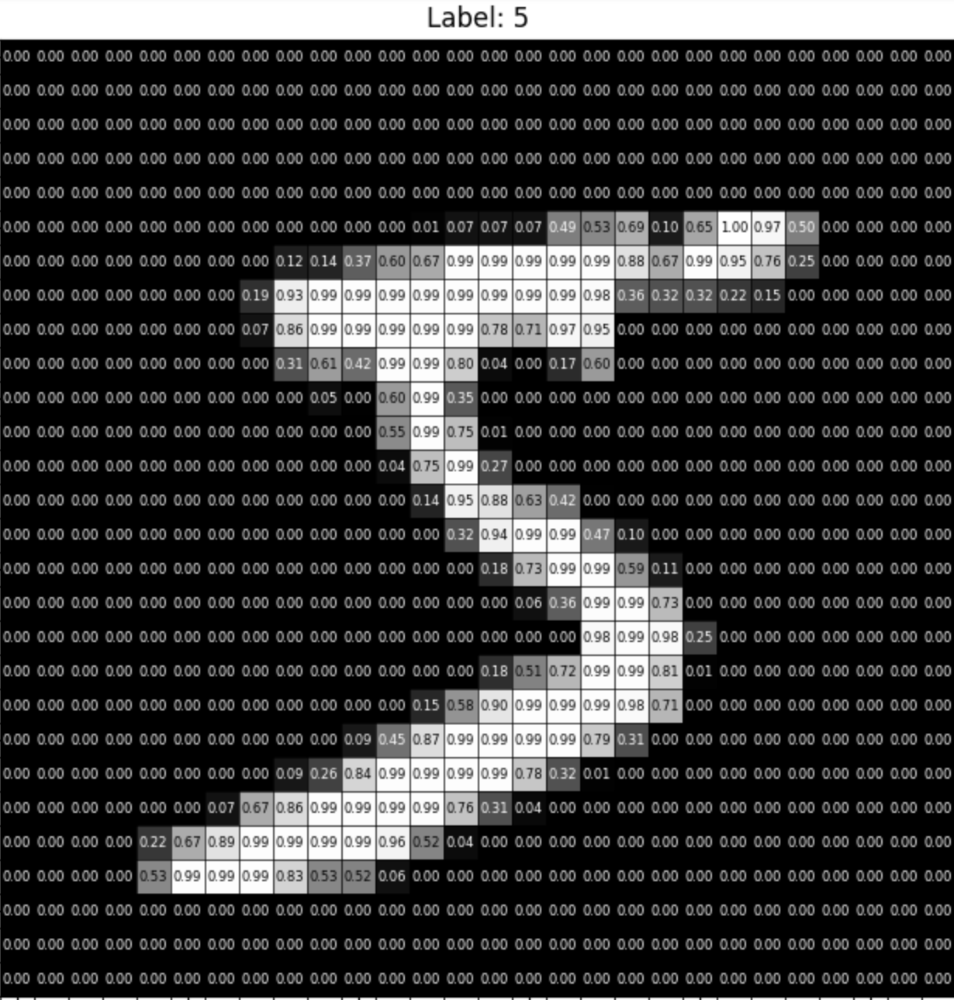

### **MNISTの階層構造**

MINISTデータセットには60,000個のサンプルデータが格納されています。<br>
各サンプルデータは、(画像データ, ラベルデータ)のタプルからできています。<br>
画像データはさらに、色チャネルごと、行ごとのテンソルへと分解できます。<br>

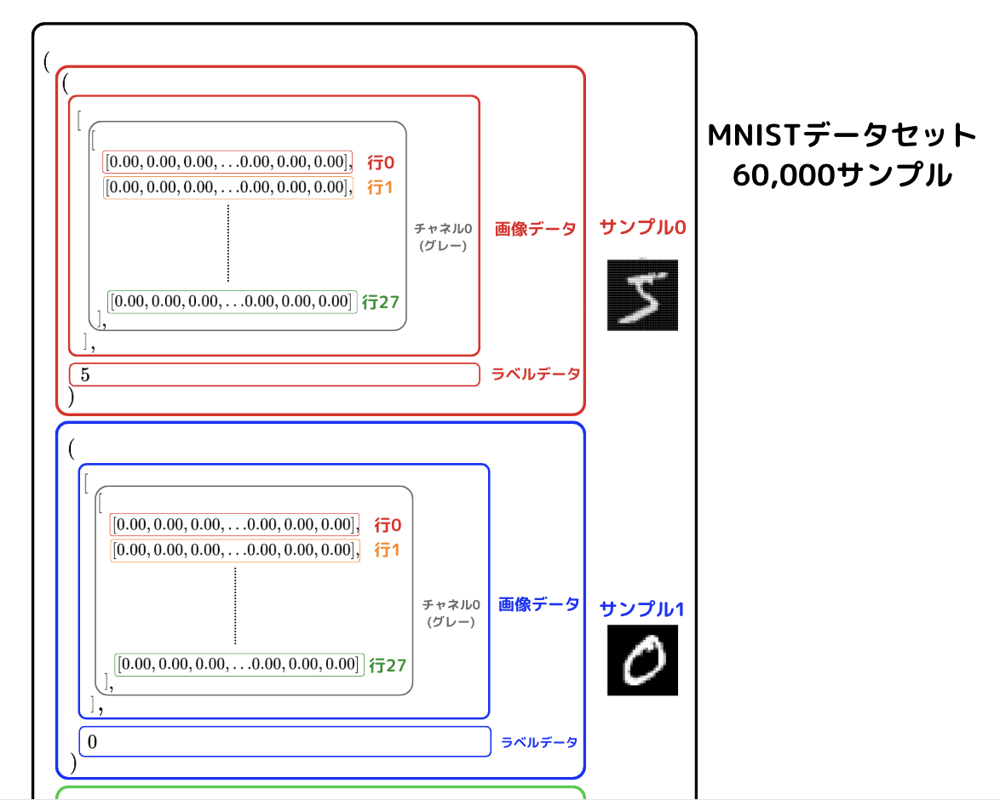

### 試しに最初の行のテンソルを表示

サンプル0、画像データ、グレーチャネル(チャネル番号0)、行0のテンソルを表示しよう。

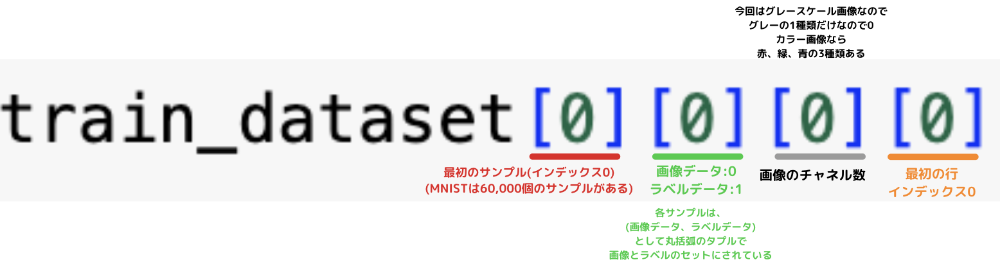

#### 行0を表示

In [ ]:
# 行0を表示する
print(train_dataset[0][0][0][0])

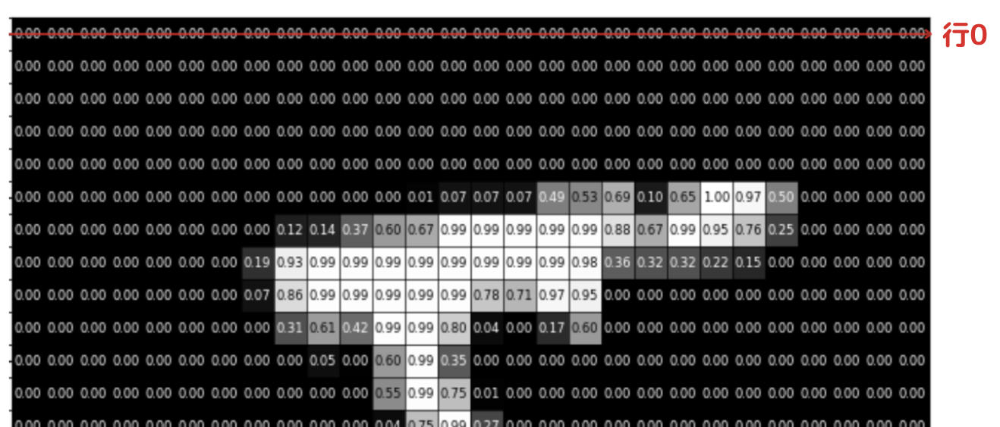

#### 行8を表示

In [ ]:
print(train_dataset[0][0][0][8]) # 行8を表示する

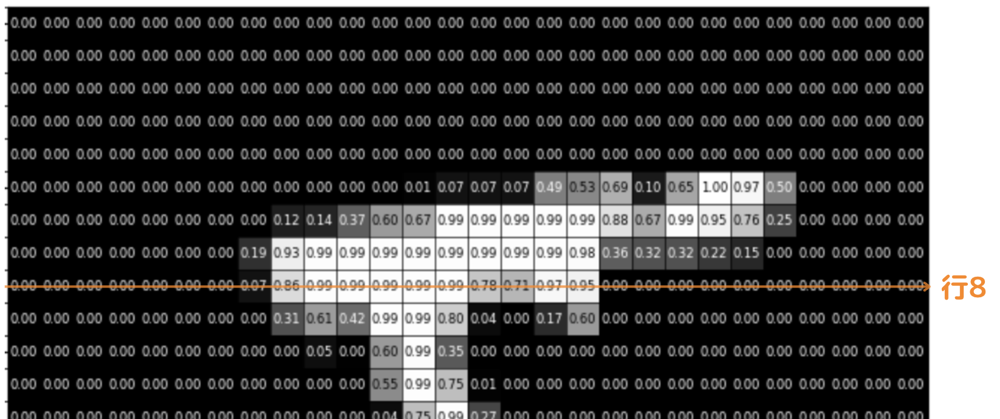

### **MNISTデータセットを 訓練:検証 = 8:2 に分割する**

```python
関数: random_split
引数: データ train_dataset, リスト [train_size, val_size]
関数(引数)
```

`random_split`関数は、指定した訓練データと検証データのサイズリスト`[train_size, val_size]`に基づいて`train_dataset`をランダムに分割するための関数です。

In [ ]:
# --- 訓練データを8:2で分割（例: 60000枚中 48000枚:train, 12000枚:val） ---
train_size = int(0.8 * len(train_dataset))  # 学習データサイズの計算
print("train size\n", train_size)

val_size   = len(train_dataset) - train_size  # 検証データサイズの計算
print("val size\n", val_size)
print(f"訓練データと検証データのサイズリスト[train_size, val_size]\n [{train_size}, {val_size}]")

train_subset, val_subset = random_split(train_dataset, [train_size, val_size])

# **データサンプル**

## **データセットの最初のサンプルをテンソルで表示する**

In [ ]:
# train_datasetの最初のサンプルについて の画像とラベルを取得（画像は shape: [1, 28, 28]）
print("label of first sample of train_dataset")
print(train_dataset[0][1]) # 最初のサンプルなのでインデックスは0、正解ラベルデータなので1

print("first image data sample of train_dataset ")
print_formatted_tensor(train_dataset[0][0]) # 最初のサンプルなのでインデックスは0、画像データなので0

# **文字認識モデル**

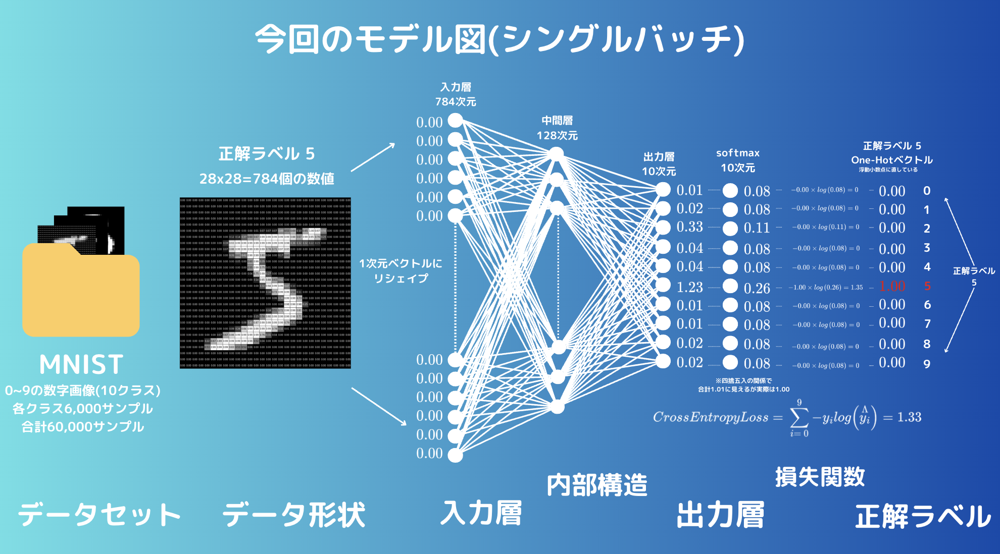

canvaの図 [1P参照]

https://www.canva.com/design/DAGfd0Iwa8I/j12-F5dw5_G85NrJTnCv2w/edit?utm_content=DAGfd0Iwa8I&utm_campaign=designshare&utm_medium=link2&utm_source=sharebutton

# **順伝播**

## **順伝播の全体図**

画像の明るさをもとにした784個の数字を入力とする784次元の入力層を持ち、128次元の中間層を経て、0~9の10種類の数字の確率(尤度)を出力する多層パーセプトロンを作成します。なお、確率といっても、厳密な確率ではなく、あくまで相対的なそれっぽさを示す「尤度」に過ぎず、総和が必ず1になるわけではないことを頭の片隅においてください。後にSoftmaxに通して確率に変換します。

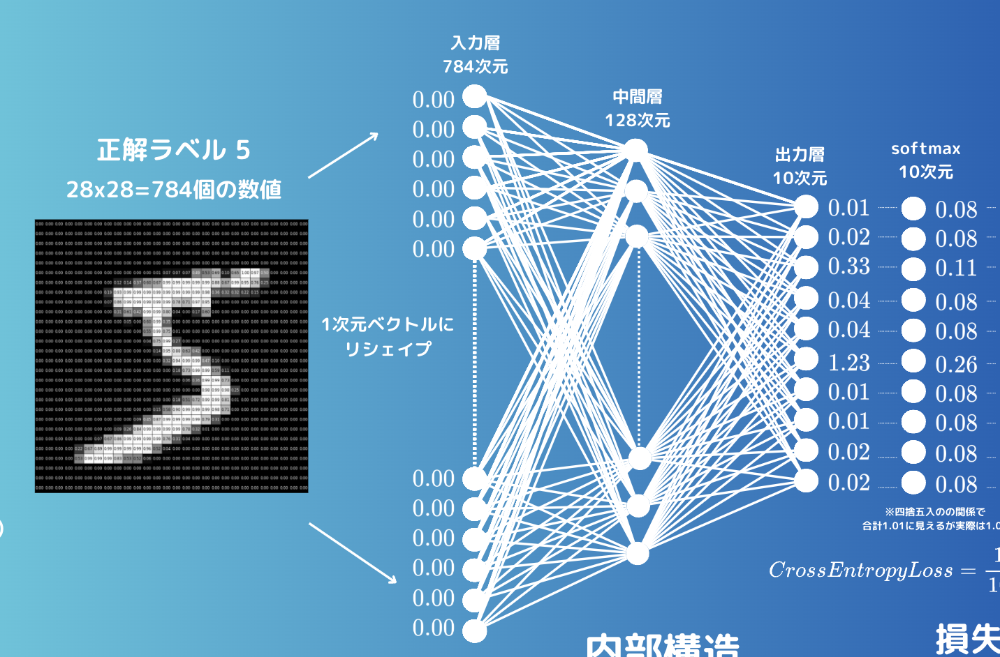

## **データサンプル→入力層**

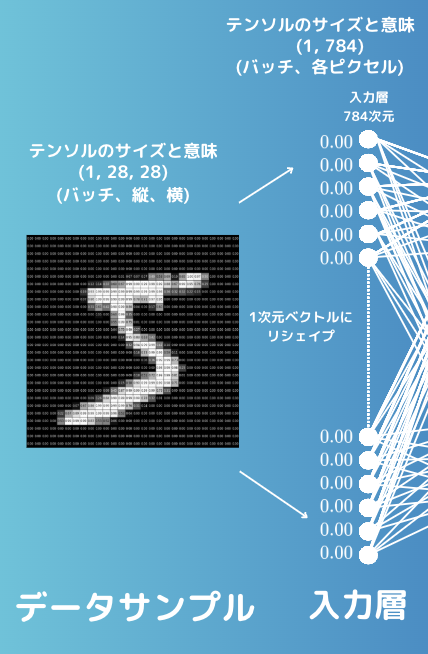

### **二次元画像テンソルをリシェイプして、行と列の区別をなくし、全結合層に入力できるようにする**

```python
メソッド: view
引数: (1, 784)

変数 = 変数.view(引数)
```
リシェイプ前：(カラーチャネル数, 行, 列) = (1, 28, 28)<br>
リシェイプ後：(カラーチャネル数, 行と列の区別なし) = (1, 784)<br><br>

注: カラーチャネル数に関してはリシェイプを行わないため、完全な一次元ベクトルにはならず(1, 784)となる。

In [ ]:
x = train_dataset[0][0] # 先ほどの画像データのテンソル (28, 28)
x_reshaped = x.view(1, 784)

print("x_reshaped")
print_formatted_tensor(x_reshaped)

## **入力層→出力層**

入力層のテンソル形状: (1, 784)<br>
出力層のテンソル形状: (1, 10)

### **入力層→出力層の図**

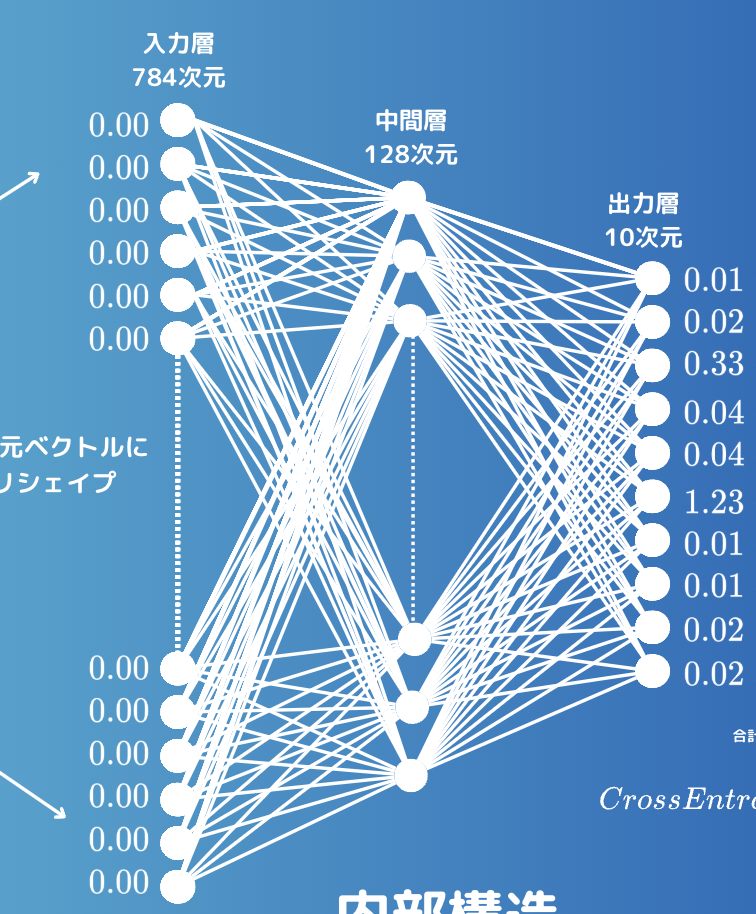

```python
クラス: nn.Linear
引数: 現在の層の次元数, 次の層の次元数
インスタンス = クラス(引数)
```

- `__init__` メソッド内で、線形変換を行う全結合層 (`nn.Linear`) を定義。
  - `self.fc1 = nn.Linear(入力次元数, 隠れ次元数)`: 入力層（入力次元数）から隠れ層（ 隠れ次元数）への線形変換。
  - `self.fc2 = nn.Linear(隠れ次元数, 出力次元数)`: 隠れ層（隠れ次元数）から出力層（出力次元数）への線形変換。

In [ ]:
fc1 = #問  nn.Linear(?, ?)  # 入力次元数, 隠れ次元数は上図を確認
fc2 = #問  nn.Linear(?, ?)  # 隠れ次元数, 出力次元数は上図を確認

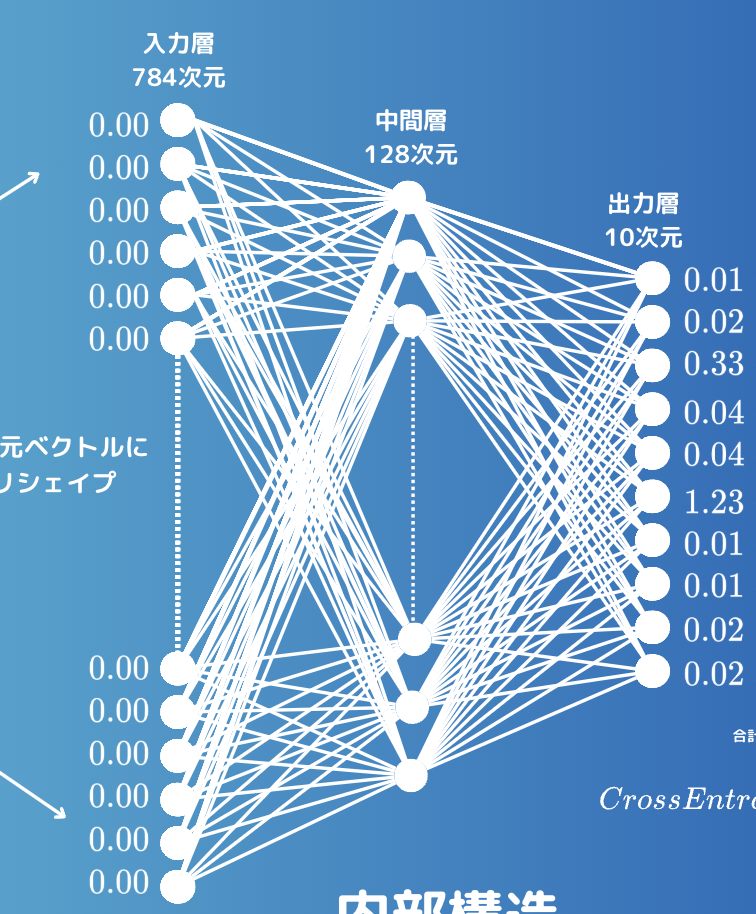

- `forward` メソッドは、ニューラルネットワークの順伝播（forward pass）を定義。

```python
x_reshapedは画像テンソルをリシェイプした入力テンソルで、(1,784)テンソルです。

h = fc1.forward(x_reshped)     入力 x を最初の全結合層 (fc1) に通し、重みとバイアスを適用。
z = torch.sigmoid(h)         中間層の活性化関数としてSigmoid関数を適用。
y_hat = fc2.forward(z)            出力層 (fc2) を通して重みとバイアスを適用。最終的な出力を得る。
```

In [ ]:
h = fc1.forward(x_reshaped)  # 入力 x を最初の全結合層 (fc1) に通し、重みとバイアスを適用。
z = torch.sigmoid(h)  # 中間層の活性化関数としてSigmoid関数を適用。
y_hat = fc2.forward(z)  # 出力層 (fc2) を通して重みとバイアスを適用。最終的な出力を得る。

print_formatted_tensor("hidden layer", h)
print_formatted_tensor("activated hidden layer", z)
print_formatted_tensor("y_hat", y_hat)

## **出力層→最終出力層**

### **出力層→最終出力層の図**

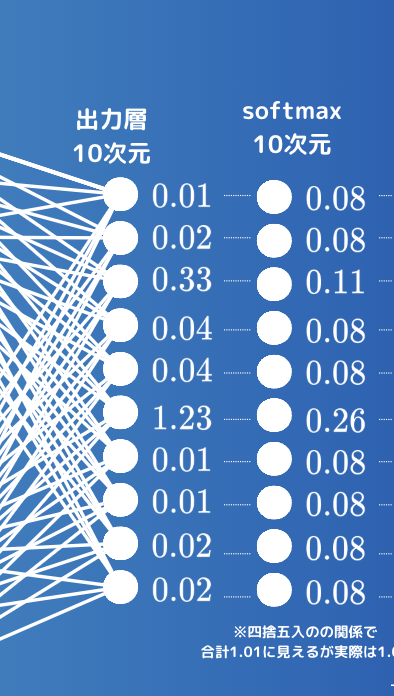

#### **ソフトマックス関数で尤度を確率に変更する**

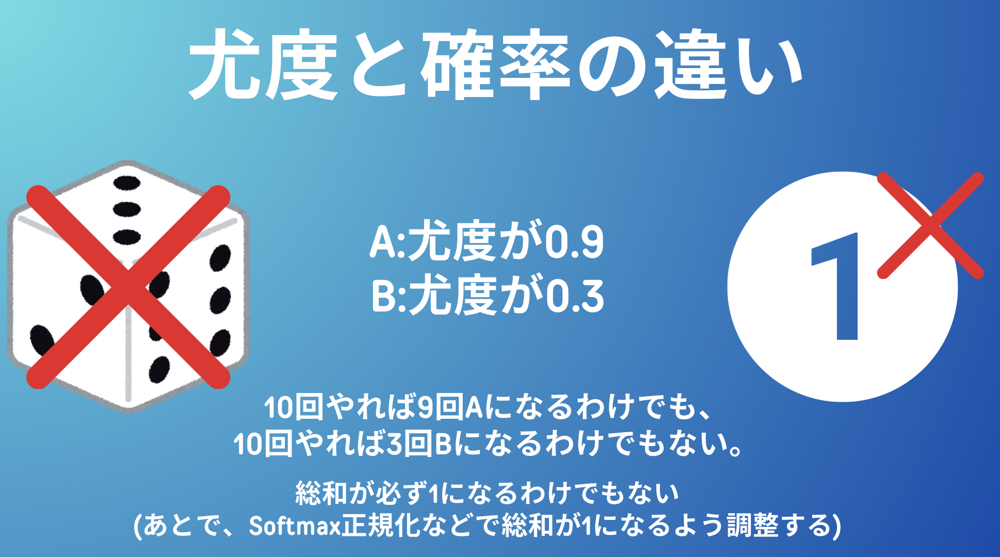

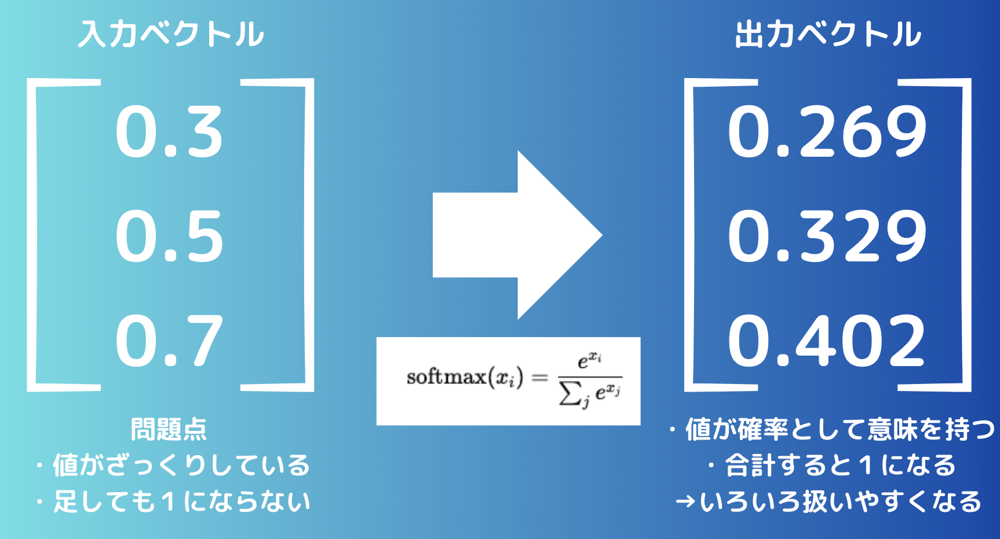

例えば、尤度が \([0.3, 0.5, 0.7]\) だったとすると、

$$
\text{softmax}(0.3) = \frac{e^{0.3}}{e^{0.3} + e^{0.5} + e^{0.7}}
= \frac{1.350}{1.35 + 1.65 + 2.01} \quad = 0.269
$$

$$
\text{softmax}(0.5) = \frac{e^{0.5}}{e^{0.3} + e^{0.5} + e^{0.7}}
= \frac{1.649}{1.35 + 1.65 + 2.01} \quad = 0.329
$$

$$
\text{softmax}(0.7) = \frac{e^{0.7}}{e^{0.3} + e^{0.5} + e^{0.7}}
= \frac{2.014}{1.35 + 1.65 + 2.01} \quad = 0.402
$$

合計すると、

$$
0.269 + 0.329 + 0.402 = 1
$$

たしかに 1 になることが確認できます。


In [ ]:
#softmaxを体感しよう
import torch
import torch.nn.functional as F
logits = torch.tensor([0.3, 0.5, 0.7])

# softmax の計算
softmax_values = F.softmax(logits, dim = 0)
print("softmax の値:", softmax_values)

後述しますが、クロスエントロピーロスでは尤度を自動的に確率に変換するため、softmaxを明示する機会は少ないです。

### **正解ラベルをOne-Hot Encodingのベクトルにして、損失計算をしやすくする**

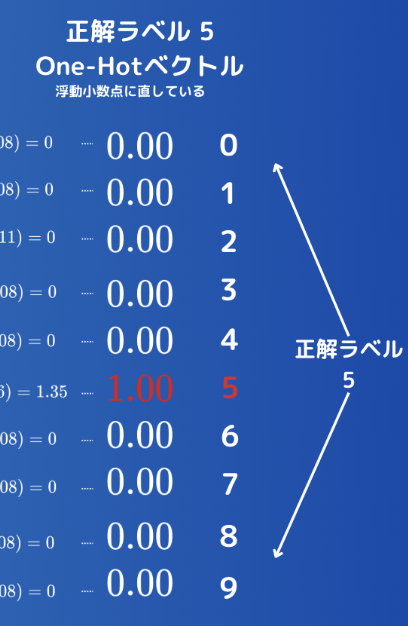

正解ラベルはただの整数なので、ワンホットエンコーディングで10次元のテンソルに変換します。<br>
例: 5 → tensor([0.00, 0.00, 0.00, 0.00, 0.00, 1.00, 0.00, 0.00, 0.00, 0.00])<br>

```python
関数: F.one_hot
引数: テンソル label_tensor, クラス数(整数) num_classes
戻り値: One-hotエンコーディングされたテンソル

関数(lable_tensor, num_classes = クラス数)
```

  - `F.one_hot` は PyTorch の `torch.nn.functional` モジュールにある関数で、整数ラベルを one-hot エンコーディングに変換します。
  - `label_tensor`: 整数値のラベルテンソル（例: `tensor([5])`）。
  - `num_classes=クラス数`: クラス数を指定。

In [ ]:
# 例：整数ラベル
label = 5  # クラス5

# label を PyTorch テンソルに変換
label_tensor = torch.tensor(label)
print("テンソル化されたラベル:", label_tensor)

label_one_hot = #問 クラス数は数字の種類の数を考える。

label_one_hot = label_one_hot.float() # F.one_hot` の出力は整数 (`int64`) になるため、.float() を適用して float 型に変換する。
print("One-hot ベクトル:", label_one_hot)

# **損失関数**

## **損失関数の図**

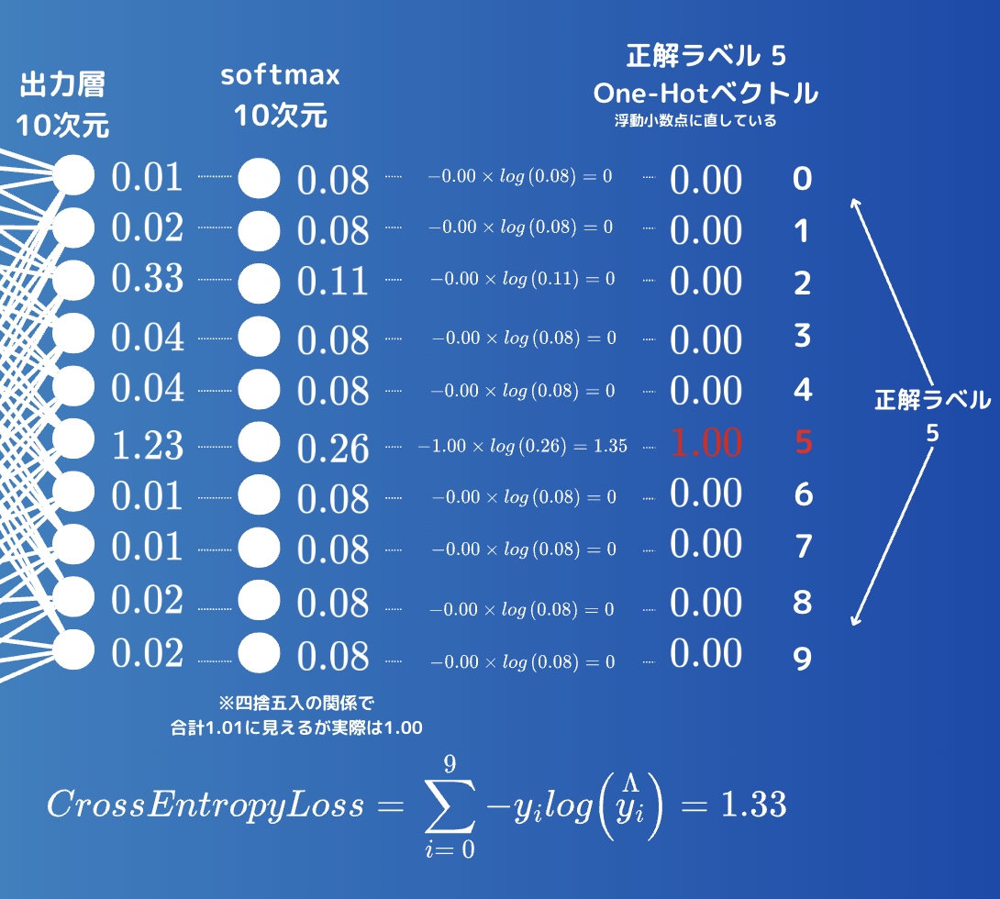

### **クロスエントロピーロス**

$$マルチクラス分類では、クラス0からクラス(C-1)の、C 個のクラスがあるとき、  
クロスエントロピーロスは次のように定義されます。$$

$$
L = -  \sum_{i=0}^{C-1} y_{i} \log(\hat~{y}_{i})
$$



$$ C : クラス数,\quad y_{i} : クラス i に対する正解ラベル（ワンホットベクトル）,\quad\hat~{y}_{i}  : モデルが出力したクラス i  の確率（Softmax の出力）$$


$$ クラス0,1,2があり、正解ラベルが1（ワンホットベクトル: [0,1,0] ）$$  
$$Softmax の出力が \quad \hat~{y} = [0.2, 0.5, 0.3] \quadの場合$$

$$
CrossEntoropyLoss = - (0 \cdot \log 0.2 + 1 \cdot \log 0.5 + 0 \cdot \log 0.3)= - \log 0.5 = 0.693
$$


```python
クラス: nn.CrossEntropyLoss
引数（設定パラメータ）: なし
```

インスタンス = クラス(設定パラメータ)

In [ ]:
criterion = #問 nn.CrossEntropyLossインスタンスを作成する。引数（設定パラメータ）の引数はなし。

### **注意点**
PyTorch の `CrossEntropyLoss` では **ワンホットエンコーディングもSoftmax関数も内部で計算してくれる** ため、正解ラベルは整数で渡し、モデル出力は尤度で渡すだけです。

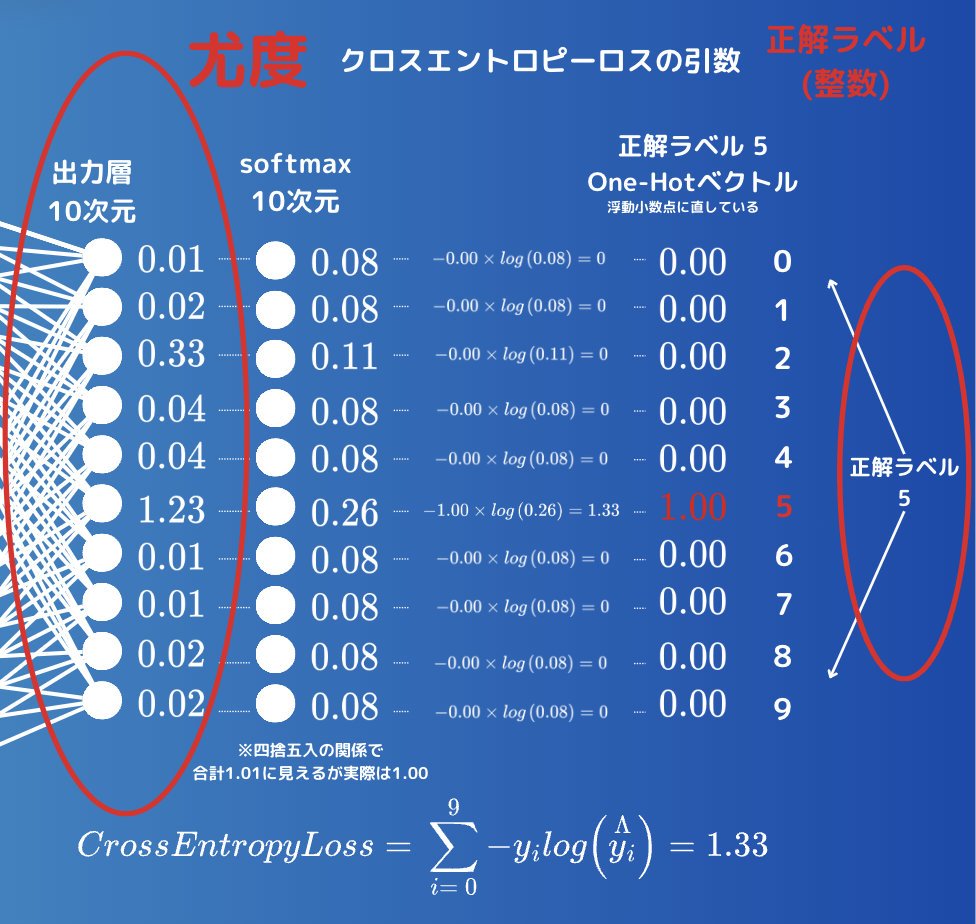

```python
インスタンス: criterion (nn.CrossEntropyLossのインスタンス)
メソッド: forward （省略可能）
引数: テンソル output_logits, テンソル target_label
```

In [ ]:
import torch
import torch.nn as nn

criterion = nn.CrossEntropyLoss()
output_logits = torch.tensor([[0.01, 0.02, 0.33, 0.04, 0.04, 1.23, 0.01, 0.01, 0.02, 0.02]])  # logits (Softmax前)
target_label = torch.tensor([5])  # 正解クラス (整数ラベル)

loss = #問 損失の計算。インスタンス.メソッド(引数)
print(loss.item())  # 1.33

### **学習**

#### **デバイスの設定**

In [ ]:
# cuda環境(NVIDIA社製のGPU)があるならGPU、ないならCPUを用いる
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

### **学習開始**

In [ ]:
# ここまでのコードを全てまとめただけなので、とりあえずShift + Enterだけして読み飛ばして良い

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

# --- モデル定義 ---
class SimpleMLP(nn.Module):
    def __init__(self):
        super().__init__()
        self.fc1 = nn.Linear(784, 128)  # 入力: 784 -> 出力: 128
        self.fc2 = nn.Linear(128, 10)   # 入力: 128 -> 出力: 10（10クラス分類）

    def forward(self, x):
        # x の形状は (batch, 1, 28, 28) を想定。バッチサイズに合わせてリシェイプ
        x_reshaped = x.view(x.shape[0], -1)  # (batch, 784)
        h = self.fc1(x_reshaped)
        z = torch.sigmoid(h)
        y_hat = self.fc2(z)
        return y_hat

# SimpleMLPクラスがnn.Moduleを親クラスとして継承しているおかげで、モデルを device (CPU または GPU) に移動する toメソッド があらかじめ使える
model = SimpleMLP().to(device)
print(model)

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=0.001)

# エポック数の設定
# エポック-同じ訓練データを何周するか。エポック3なら、訓練データ48,000サンプルを3周 = 144,000回、損失計算とパラメータ更新を行う。
num_epochs = 3

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for image, label in train_subset:  # 1枚ずつ処理
        image = image.to(device)  # [1, 28, 28]

        # labelをテンソル化してデバイスに移動
        label = torch.tensor(label, device=device)  # shape 5, 0 などの整数値 → [1]

        # One-hotエンコーディング
        label_one_hot = F.one_hot(label, num_classes=10).float() # shape: [10]

        optimizer.zero_grad()
        image_reshaped = image.view(1, 784)  # shape: [1, 28, 28] → [1, 784]
        output = model.forward(image_reshaped) # output shape: [1, 10] カラーチャネル数を示す必要がある関係で形状に1が残る

        # output と同じ形になるように unsqueezeを用いて shape: [10] → [1, 10]
        label_one_hot = label_one_hot.unsqueeze(0) # shape: [10] → [1, 10]

        loss = criterion(output, label_one_hot)  # クロスエントロピーロス適用
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    epoch_loss = running_loss / len(train_subset)

    # バリデーションデータでの評価
    model.eval()
    correct = 0
    total = 0
    with torch.no_grad():
        for image, label in val_subset:
            image = image.to(device)  # [1, 28, 28]

            # labelをテンソル化してデバイスに移動
            label = torch.tensor(label, device=device)  # 5, 0 などの整数値

            output = model(image.unsqueeze(0))
            _, predicted = torch.max(output, 1)  # ロジットの最大値を持つクラスを選択
            total += 1
            correct += (predicted == label).sum().item()

    val_acc = correct / total
    print(f"Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss:.4f}, Val Acc: {val_acc:.4f}")


In [ ]:
# 以下のコードは評価用なので読まなくて良い

# モデルを評価モードに
model.eval()
correct = 0
total = 0

# 勾配計算不要のモード
with torch.no_grad():
    for image, label in test_dataset:  # 1枚ずつ処理
        image = image.to(device)  # [1, 28, 28]
        label = torch.tensor(label, device=device)  # 整数値ラベル (e.g., 5, 0, etc.)

        # モデルの推論
        output = model(image.unsqueeze(0))  # [1, 10] に変換
        _, predicted = torch.max(output, 1)  # 最大値のインデックスを取得

        # 精度計算
        total += 1
        correct += (predicted == label).sum().item()

# 正解率（Accuracy）の計算
test_acc = correct / total
print(f"Test Accuracy: {test_acc:.4f}")


In [ ]:
#以下のコードは表示用なので読まなくて良い

import numpy as np
import matplotlib.pyplot as plt
import torch

# テストデータからランダムに10枚選択
num_images = 10
random_indices = np.random.choice(len(test_dataset), num_images, replace=False)

# モデルを評価モードに
model.eval()

# プロットの設定
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
axes = axes.flatten()

# 選択した画像を1枚ずつ処理
for i, idx in enumerate(random_indices):
    image, true_label = test_dataset[idx]  # image: [1, 28, 28]

    # 画像をデバイスへ送る
    image = image.to(device)

    # モデルの推論
    with torch.no_grad():
        output = model(image.unsqueeze(0))  # [1, 10]
        _, predicted_label = torch.max(output, 1)

    # 画像を表示
    axes[i].imshow(image.cpu().squeeze().numpy(), cmap='gray')
    axes[i].set_title(f"Pred: {predicted_label.item()}\nTrue: {true_label}")
    axes[i].axis('off')

# レイアウトの調整と表示
plt.tight_layout()
plt.show()
